In [79]:
import os
import json

def load_json_files(folder_path):
    data = []
    for folder_name in os.listdir(folder_path):
        folder_full_path = os.path.join(folder_path, folder_name)
        if os.path.isdir(folder_full_path):
            files = os.listdir(folder_full_path)
            for file_name in files:
                if file_name.endswith('.json'):
                    file_path = os.path.join(folder_full_path, file_name)
                    folder_split= folder_name.split("_")    

                    dataset = {
                        'model' : folder_split[0],
                        'threshold' : folder_split[-1],
                        'finetune' :  folder_split[2],
                        'dataset' : file_name.replace("_results.json" , ""),
                        'results' : None
                    }

                    with open(file_path, 'r') as f:
                        dataset['results'] = json.load(f)

                    data.append(dataset)
    return data

# Load all JSON files in the 'res' folder
folder_path = './results/'
data = load_json_files(folder_path)


In [77]:
import numpy as np
from itertools import groupby

# def calculate_mean(data,key):
#     msrts, msrbs = [], []
#     for item in data:
#         msrts.append(item['metrics'][key]['msrt'])
#         msrbs.append(item['metrics'][key]['msrb'])  
#     msrts = np.asarray(msrts)
#     msrbs = np.asarray(msrbs)
#     mean_msrt = msrts.sum() / len(msrts)
#     mean_msrb = msrbs.sum() / len(msrbs)
#     return float(round(mean_msrt,2)), float(round(mean_msrb,2))


def calculate_mean(data,key,mkey):
    m= []
    for item in data:
        if item['metrics'][key][mkey] is None or np.isnan(item['metrics'][key][mkey]):
            continue
        m.append(item['metrics'][key][mkey])
    if len(m) == 0:
        return None
    
    m = np.asarray(m)
    m = m.sum() / len(m)
    return float(round(m,2))


results = []
for d in data:
    # get list of all keys resulst
    sal_keys = list(d['results'][0]['metrics'].keys())
    for key in sal_keys:
        result= {
            'model' : d['model'],
            'dataset' : d['dataset'],
            'threshold' : d['threshold'],
            'finetune' : d['finetune'],
            'key' : key,
            'metrics' :  {
            }
        }   

        metrics_keys = list(d['results'][0]['metrics'][key].keys())
        for mkey in metrics_keys:
            if mkey== "statistics":
                continue
            mean__ = calculate_mean(d['results'],key,mkey)
            if mean__ is None:
                continue
            result['metrics'][mkey] = mean__
        results.append(result)


results = sorted(results, key=lambda x: ( x['key']))

# Group results by dataset, model, and key
grouped_results = {}
for key, group in groupby(results, key=lambda x: (x['dataset'], x['model'], x['key'])):
    grouped_results[key] = list(group)

# Print grouped results
for key, group in grouped_results.items():
    print(f"Dataset: {key[0]}, Model: {key[1]}, Key: {key[2]}")
    for item in group:
        print(f"threshold : {item['threshold']} | {item['metrics']}")




Dataset: mit1003, Model: TempSal, Key: GT
threshold : 0.5 | {'NSS': 0.89, 'CC': 1.0, 'KLD': 1.55, 'SIM': 1.0}
threshold : 0.9 | {'NSS': 0.89, 'CC': 1.0, 'KLD': 1.55, 'SIM': 1.0}
Dataset: p3_orientations, Model: TranSalNetDense, Key: rarity
threshold : 0.9 | {'msrt': 1.01, 'msrb': 1.63}
Dataset: mit1003, Model: TranSalNetDense, Key: rarity
threshold : 0.9 | {'NSS': 0.52, 'CC': 0.33, 'KLD': 1.52, 'SIM': 0.66}
Dataset: o3, Model: TranSalNetDense, Key: rarity
threshold : 0.9 | {'msrt': 1.19, 'msrb': 1.22}
Dataset: p3_sizes, Model: TranSalNetDense, Key: rarity
threshold : 0.9 | {'msrt': 0.89, 'msrb': 1.59}
Dataset: p3_colors, Model: TranSalNetDense, Key: rarity
threshold : 0.9 | {'msrt': 1.56, 'msrb': 1.18}
Dataset: p3_orientations, Model: Unisal, Key: rarity
threshold : 0.9 | {'msrt': 2.94, 'msrb': 1.04}
Dataset: mit1003, Model: Unisal, Key: rarity
threshold : 0.9 | {'NSS': 0.57, 'CC': 0.47, 'KLD': 1.46, 'SIM': 0.65}
Dataset: o3, Model: Unisal, Key: rarity
threshold : 0.9 | {'msrt': 1.22, 

Model :  TranSalNetDense 0.5 true p3_orientations
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.7296776620370378, Median saliency msrt: 0.7647, Variance saliency msrt: 0.0534610293737006
Mean saliency_Add msrt: 0.8695363425925926, Median saliency_Add msrt: 0.8553, Variance saliency_Add msrt: 0.13624334208199376
Mean saliency msrb: 1.6576196759259272, Median saliency msrb: 1.3077, Variance saliency msrb: 1.4551561883860042
Mean saliency_Add msrb: 1.647378009259258, Median saliency_Add msrb: 1.2562, Variance saliency_Add msrb: 1.2023001129191864


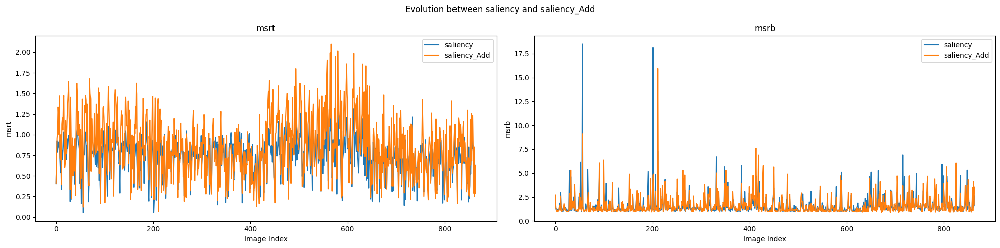

Model :  TranSalNetDense 0.5 true mit1003
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['NSS', 'CC', 'KLD', 'SIM']
Mean saliency NSS: 0.990077269487343, Median saliency NSS: 0.9605000019073486, Variance saliency NSS: 0.07963707313250618
Mean saliency_Add NSS: 0.908540179750558, Median saliency_Add NSS: 0.8802000284194946, Variance saliency_Add NSS: 0.09117007986992799
Mean saliency CC: 0.6588360917248259, Median saliency CC: 0.6707, Variance saliency CC: 0.014206570821016512
Mean saliency_Add CC: 0.6126157527417743, Median saliency_Add CC: 0.6338, Variance saliency_Add CC: 0.018311130021043558
Mean saliency KLD: 0.9377387836490524, Median saliency KLD: 0.8665, Variance saliency KLD: 0.15440264026053438
Mean saliency_Add KLD: 1.0505651046859412, Median saliency_Add KLD: 1.0227, Variance saliency_Add KLD: 0.047887640856095696
Mean saliency SIM: 0.5619850448654031, Median saliency SIM: 0.5587, Variance saliency SIM: 0.0137776496068524

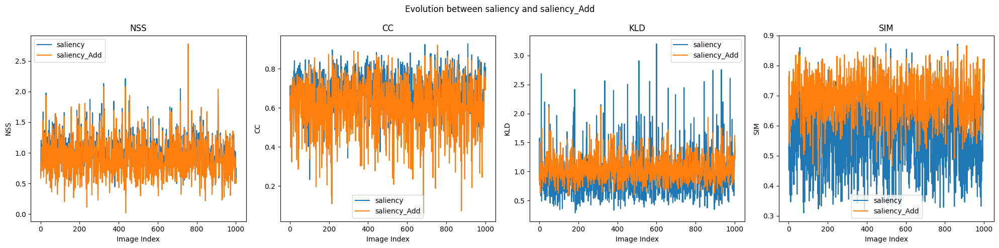

Model :  TranSalNetDense 0.5 true o3
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 1.0699792103948058, Median saliency msrt: 1.0119, Variance saliency msrt: 0.16029100958278503
Mean saliency_Add msrt: 1.1371431284357858, Median saliency_Add msrt: 1.0805, Variance saliency_Add msrt: 0.19183109380710378
Mean saliency msrb: 0.8874674162918544, Median saliency msrb: 0.8624, Variance saliency msrb: 0.5349418667044183
Mean saliency_Add msrb: 0.8994045477261371, Median saliency_Add msrb: 0.8667, Variance saliency_Add msrb: 0.5715366349068545


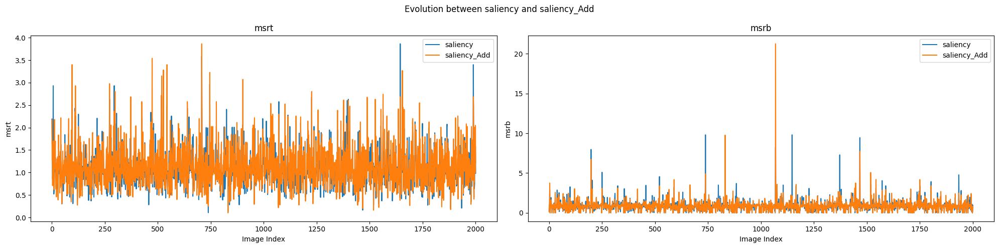

Model :  TranSalNetDense 0.5 true p3_sizes
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.7013241666666664, Median saliency msrt: 0.7373, Variance saliency msrt: 0.05625154459454365
Mean saliency_Add msrt: 0.8483092857142873, Median saliency_Add msrt: 0.8588, Variance saliency_Add msrt: 0.11570034119948978
Mean saliency msrb: 2.0835717857142892, Median saliency msrb: 1.3403, Variance saliency msrb: 9.61431395985874
Mean saliency_Add msrb: 1.7786648809523815, Median saliency_Add msrb: 1.25, Variance saliency_Add msrb: 3.5887226822309386


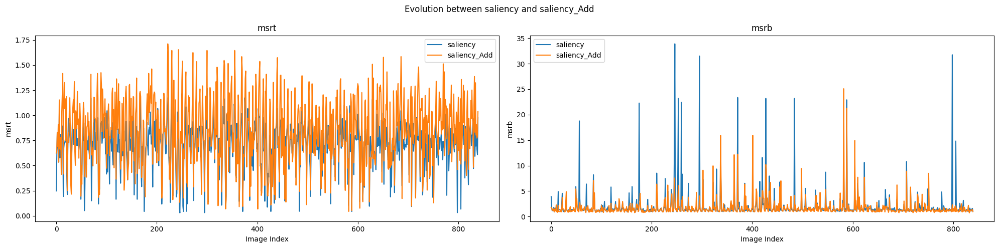

Model :  TranSalNetDense 0.5 true p3_colors
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.7982045197740111, Median saliency msrt: 0.7686, Variance saliency msrt: 0.12786140402476945
Mean saliency_Add msrt: 1.1859952542372882, Median saliency_Add msrt: 1.1741, Variance saliency_Add msrt: 0.2728573994351051
Mean saliency msrb: 1.7142414689265528, Median saliency msrb: 1.2581, Variance saliency msrb: 2.3778936913537825
Mean saliency_Add msrb: 1.3330621468926567, Median saliency_Add msrb: 1.0408, Variance saliency_Add msrb: 0.7739873091095143


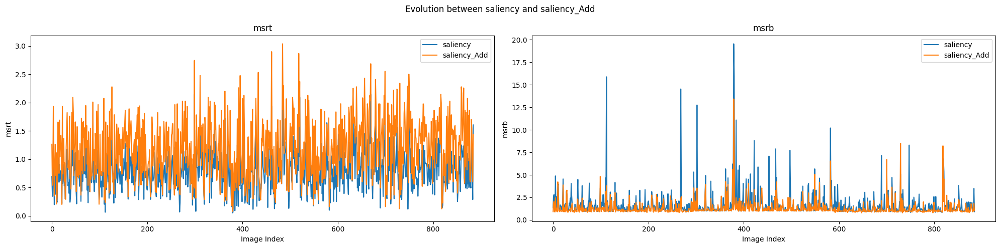

Model :  Unisal None true p3_orientations
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.13671435185185182, Median saliency msrt: 0.051, Variance saliency msrt: 0.04482569067365395
Mean saliency_Add msrt: 0.8082590277777776, Median saliency_Add msrt: 0.8, Variance saliency_Add msrt: 0.039997894524980725
Mean saliency msrb: 123.89355324074076, Median saliency msrb: 9.7692, Variance saliency msrb: 4566812.159139542
Mean saliency_Add msrb: 1.3204013888888881, Median saliency_Add msrb: 1.2277, Variance saliency_Add msrb: 0.1326386676138117


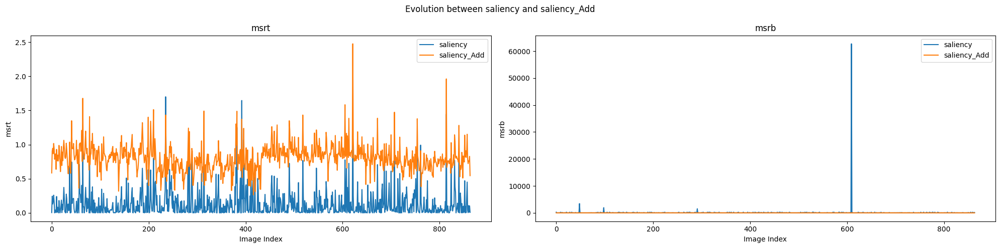

Model :  Unisal None true mit1003
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['NSS', 'CC', 'KLD', 'SIM']
Mean saliency NSS: 0.758184546522577, Median saliency NSS: 0.7439000010490417, Variance saliency NSS: 0.08221653434456555
Mean saliency_Add NSS: 0.8144321034055162, Median saliency_Add NSS: 0.7994999885559082, Variance saliency_Add NSS: 0.079190706003875
Mean saliency CC: 0.5512369890329016, Median saliency CC: 0.5629, Variance saliency CC: 0.011985852978770568
Mean saliency_Add CC: 0.6546832502492531, Median saliency_Add CC: 0.6666, Variance saliency_Add CC: 0.009836799859027114
Mean saliency KLD: 1.0421284147557326, Median saliency KLD: 0.9669, Variance saliency KLD: 0.17826944801613115
Mean saliency_Add KLD: 1.1578087736789608, Median saliency_Add KLD: 1.1239, Variance saliency_Add KLD: 0.06560579481833666
Mean saliency SIM: 0.5139341974077769, Median saliency SIM: 0.5157, Variance saliency SIM: 0.0014524782622421855
Mean s

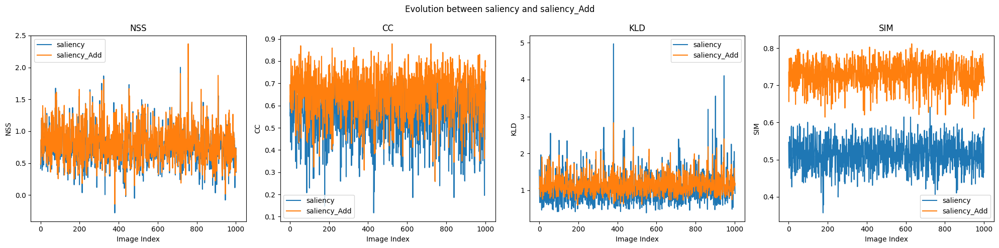

Model :  Unisal None true o3
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.8066686156921541, Median saliency msrt: 0.651, Variance saliency msrt: 0.44687212755075856
Mean saliency_Add msrt: 0.9978447276361834, Median saliency_Add msrt: 0.937, Variance saliency_Add msrt: 0.19464150015336074
Mean saliency msrb: 1.825336431784108, Median saliency msrb: 1.02, Variance saliency msrb: 19.026636509402316
Mean saliency_Add msrb: 0.9559734132933537, Median saliency_Add msrb: 0.9029, Variance saliency_Add msrb: 0.38737901861348695


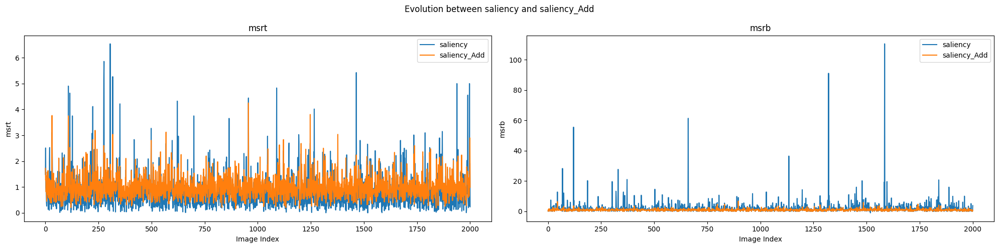

Model :  Unisal None true p3_sizes
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.1293082142857144, Median saliency msrt: 0.0667, Variance saliency msrt: 0.028726297515858788
Mean saliency_Add msrt: 0.7092203571428571, Median saliency_Add msrt: 0.7216, Variance saliency_Add msrt: 0.03728241876415821
Mean saliency msrb: 43.39459940476189, Median saliency msrb: 8.4667, Variance saliency msrb: 13969.045705257324
Mean saliency_Add msrb: 1.4770888095238095, Median saliency_Add msrb: 1.3294, Variance saliency_Add msrb: 0.2970614019938208


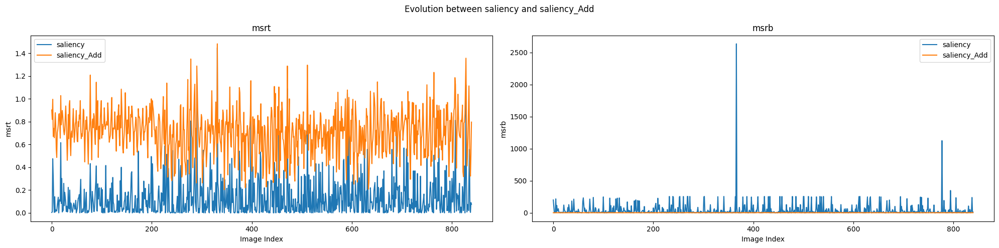

Model :  Unisal None true p3_colors
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.3033685875706215, Median saliency msrt: 0.1647, Variance saliency msrt: 0.13801610825619737
Mean saliency_Add msrt: 1.0818532203389843, Median saliency_Add msrt: 0.9765, Variance saliency_Add msrt: 0.18029825333708713
Mean saliency msrb: 19.593891299435036, Median saliency msrb: 4.9756, Variance saliency msrb: 1809.2794365157808
Mean saliency_Add msrb: 1.057098757062149, Median saliency_Add msrb: 0.9913, Variance saliency_Add msrb: 0.11143974968207088


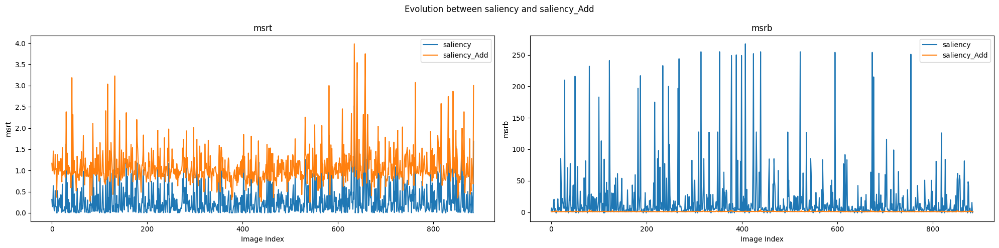

Model :  TempSal 0.5 true p3_orientations
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.4441369212962961, Median saliency msrt: 0.2451, Variance saliency msrt: 0.2796979407780211
Mean saliency_Add msrt: 0.789846759259259, Median saliency_Add msrt: 0.6667, Variance saliency_Add msrt: 0.1942133082533864
Mean saliency msrb: 131.77414143518516, Median saliency msrb: 3.0488, Variance saliency msrb: 5425843.796492775
Mean saliency_Add msrb: 1.6263488425925934, Median saliency_Add msrb: 1.4624, Variance saliency_Add msrb: 0.409309042336623


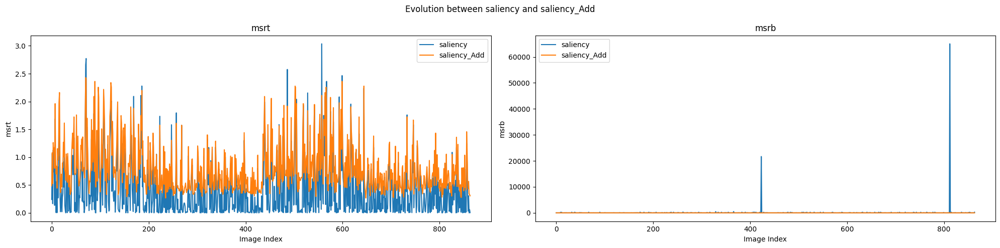

Model :  TempSal 0.5 true mit1003
Metrics :  ['GT', 'saliency', 'rarity', 'saliency_Add', 'saliency_Prod', 'saliency_Itti']
['NSS', 'CC', 'KLD', 'SIM']
Mean saliency NSS: 0.9393891316586929, Median saliency NSS: 0.9200999736785889, Variance saliency NSS: 0.08700733476892165
Mean saliency_Add NSS: 0.8590198406580082, Median saliency_Add NSS: 0.8378000259399414, Variance saliency_Add NSS: 0.08833092928443126
Mean saliency CC: 0.6416356929212369, Median saliency CC: 0.6537, Variance saliency CC: 0.00810402012182793
Mean saliency_Add CC: 0.603145762711865, Median saliency_Add CC: 0.6161, Variance saliency_Add CC: 0.011421506350440194
Mean saliency KLD: 0.8860582253240276, Median saliency KLD: 0.8239, Variance saliency KLD: 0.11005440107641186
Mean saliency_Add KLD: 1.0835036889332001, Median saliency_Add KLD: 1.0475, Variance saliency_Add KLD: 0.05663944109307165
Mean saliency SIM: 0.5356086739780663, Median saliency SIM: 0.5358, Variance saliency SIM: 0.0019761650394181387
Mean saliency_A

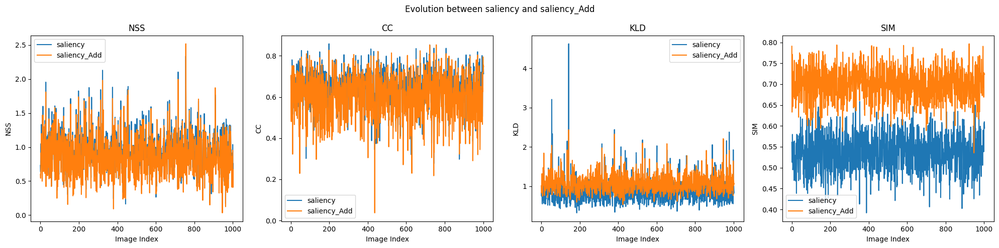

Model :  TempSal 0.5 true o3
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 1.0783902048975527, Median saliency msrt: 1.0126, Variance saliency msrt: 0.23818543664568517
Mean saliency_Add msrt: 1.151752723638185, Median saliency_Add msrt: 1.1039, Variance saliency_Add msrt: 0.21845511804480572
Mean saliency msrb: 1.163637381309347, Median saliency msrb: 0.8419, Variance saliency msrb: 56.42605133769292
Mean saliency_Add msrb: 0.8900301349325347, Median saliency_Add msrb: 0.8471, Variance saliency_Add msrb: 0.2970976060733949


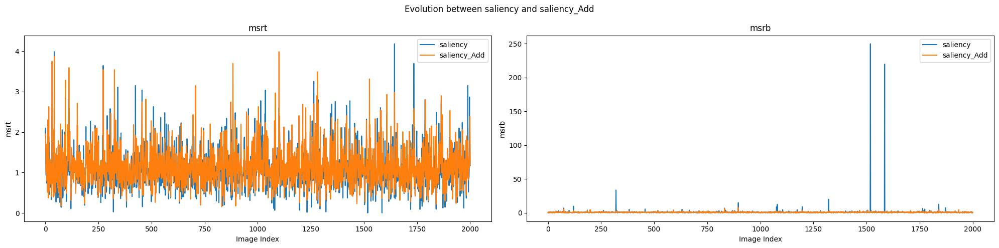

Model :  TempSal 0.5 true p3_sizes
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.5227486904761897, Median saliency msrt: 0.3255, Variance saliency msrt: 0.32487979504590364
Mean saliency_Add msrt: 0.7144540476190478, Median saliency_Add msrt: 0.6063, Variance saliency_Add msrt: 0.16007991765028326
Mean saliency msrb: 44.270778333333304, Median saliency msrb: 1.8613, Variance saliency msrb: 205439.68031637144
Mean saliency_Add msrb: 1.8478207142857133, Median saliency_Add msrb: 1.6039, Variance saliency_Add msrb: 0.7491048625232994


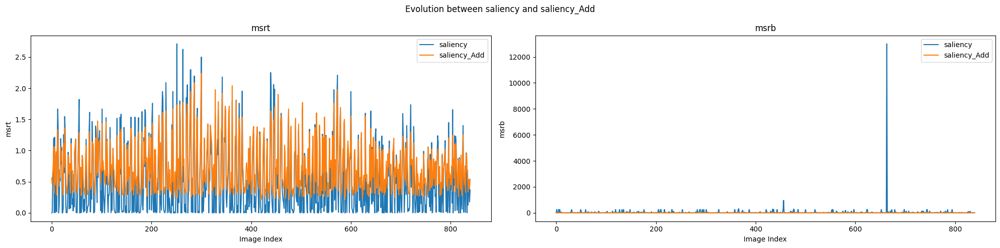

Model :  TempSal 0.5 true p3_colors
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 1.6989618079096032, Median saliency msrt: 1.5592, Variance saliency msrt: 1.3130469538859941
Mean saliency_Add msrt: 2.0193536723163863, Median saliency_Add msrt: 1.9466, Variance saliency_Add msrt: 0.8237142971983801
Mean saliency msrb: 4.087257175141251, Median saliency msrb: 1.0494, Variance saliency msrb: 530.4984465020418
Mean saliency_Add msrb: 0.9844787570621496, Median saliency_Add msrb: 0.9333, Variance saliency_Add msrb: 0.057141417650432576


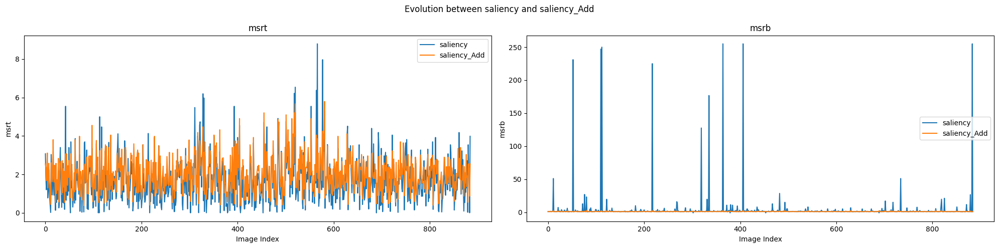

Model :  TranSalNetRes 0.9 true p3_orientations
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.529404166666667, Median saliency msrt: 0.5098, Variance saliency msrt: 0.08553503785300928
Mean saliency_Add msrt: 0.718458217592592, Median saliency_Add msrt: 0.6941, Variance saliency_Add msrt: 0.11751195951580456
Mean saliency msrb: 4.351465277777785, Median saliency msrb: 1.9922, Variance saliency msrb: 66.43808521691928
Mean saliency_Add msrb: 1.9488018518518515, Median saliency_Add msrb: 1.4639, Variance saliency_Add msrb: 1.875365954857683


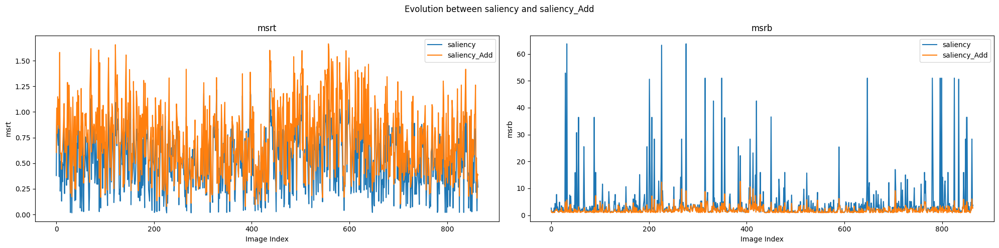

Model :  TranSalNetRes 0.9 true mit1003
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['NSS', 'CC', 'KLD', 'SIM']
Mean saliency NSS: 0.978158823016693, Median saliency NSS: 0.9563000202178955, Variance saliency NSS: 0.08193133184575326
Mean saliency_Add NSS: 0.9269124627083629, Median saliency_Add NSS: 0.9096999764442444, Variance saliency_Add NSS: 0.09302626024156559
Mean saliency CC: 0.6560100697906281, Median saliency CC: 0.6673, Variance saliency CC: 0.012687512730104784
Mean saliency_Add CC: 0.6292495513459624, Median saliency_Add CC: 0.6512, Variance saliency_Add CC: 0.019316449478861537
Mean saliency KLD: 0.9347884346959116, Median saliency KLD: 0.8601, Variance saliency KLD: 0.14326204385427968
Mean saliency_Add KLD: 1.0607132602193416, Median saliency_Add KLD: 1.032, Variance saliency_Add KLD: 0.050797111239919285
Mean saliency SIM: 0.5621035892323031, Median saliency SIM: 0.5684, Variance saliency SIM: 0.012447265690008737

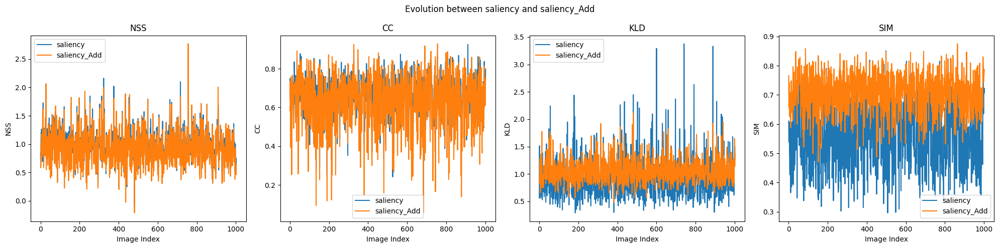

Model :  TranSalNetRes 0.9 true o3
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 1.011570064967516, Median saliency msrt: 0.9922, Variance saliency msrt: 0.16299735897895615
Mean saliency_Add msrt: 1.0675321839080503, Median saliency_Add msrt: 1.024, Variance saliency_Add msrt: 0.1952891601136212
Mean saliency msrb: 0.953439980009994, Median saliency msrb: 0.9059, Variance saliency msrb: 1.6813527869073448
Mean saliency_Add msrb: 0.9471916041979015, Median saliency_Add msrb: 0.898, Variance saliency_Add msrb: 0.41536509890002316


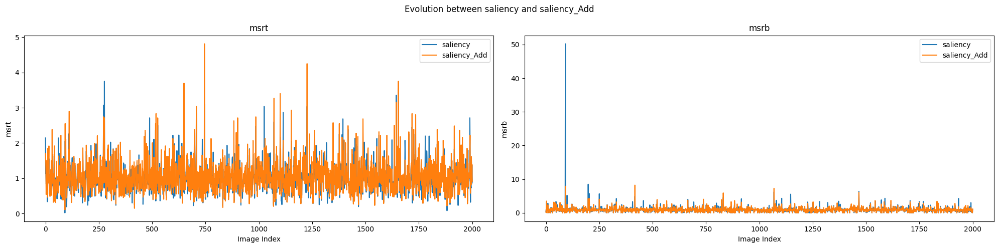

Model :  TranSalNetRes 0.9 true p3_sizes
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.517646428571429, Median saliency msrt: 0.4824, Variance saliency msrt: 0.09066227555867346
Mean saliency_Add msrt: 0.6655166666666662, Median saliency_Add msrt: 0.642, Variance saliency_Add msrt: 0.10453011846031739
Mean saliency msrb: 5.503800952380957, Median saliency msrb: 2.0565, Variance saliency msrb: 268.84818953576126
Mean saliency_Add msrb: 2.188608571428576, Median saliency_Add msrb: 1.5361, Variance saliency_Add msrb: 6.251426316116995


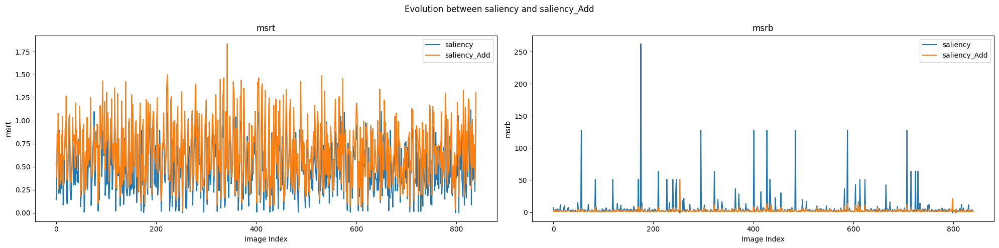

Model :  TranSalNetRes 0.9 true p3_colors
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.5844615819209045, Median saliency msrt: 0.5529, Variance saliency msrt: 0.1042163591342206
Mean saliency_Add msrt: 0.8091734463276825, Median saliency_Add msrt: 0.7333, Variance saliency_Add msrt: 0.1620626609785183
Mean saliency msrb: 3.421027683615825, Median saliency msrb: 1.8201, Variance saliency msrb: 48.76839411108672
Mean saliency_Add msrb: 1.7298914124293787, Median saliency_Add msrb: 1.3421, Variance saliency_Add msrb: 1.4308814277454613


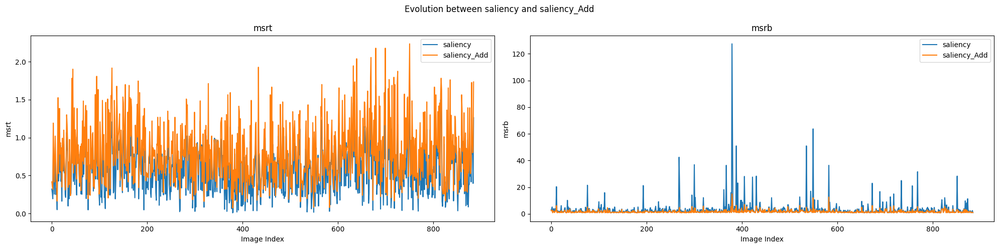

Model :  TranSalNetDense None true p3_orientations
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.7296776620370378, Median saliency msrt: 0.7647, Variance saliency msrt: 0.0534610293737006
Mean saliency_Add msrt: 0.868692824074075, Median saliency_Add msrt: 0.8547, Variance saliency_Add msrt: 0.1334258542077655
Mean saliency msrb: 1.6576196759259272, Median saliency msrb: 1.3077, Variance saliency msrb: 1.4551561883860042
Mean saliency_Add msrb: 1.636622337962963, Median saliency_Add msrb: 1.2562, Variance saliency_Add msrb: 1.1267149532394438


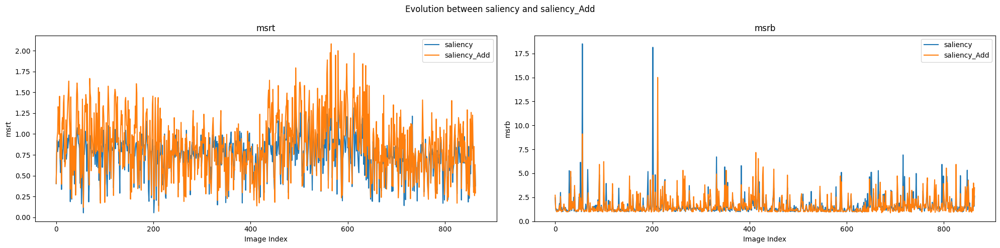

Model :  TranSalNetDense None true mit1003
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['NSS', 'CC', 'KLD', 'SIM']
Mean saliency NSS: 0.990077269487343, Median saliency NSS: 0.9605000019073486, Variance saliency NSS: 0.07963707313250618
Mean saliency_Add NSS: 0.909182053848596, Median saliency_Add NSS: 0.8822000026702881, Variance saliency_Add NSS: 0.0913794378081007
Mean saliency CC: 0.6588360917248259, Median saliency CC: 0.6707, Variance saliency CC: 0.014206570821016512
Mean saliency_Add CC: 0.6152829511465598, Median saliency_Add CC: 0.6355, Variance saliency_Add CC: 0.018214872899765346
Mean saliency KLD: 0.9377387836490524, Median saliency KLD: 0.8665, Variance saliency KLD: 0.15440264026053438
Mean saliency_Add KLD: 1.0614556331006981, Median saliency_Add KLD: 1.0367, Variance saliency_Add KLD: 0.04741205223895614
Mean saliency SIM: 0.5619850448654031, Median saliency SIM: 0.5587, Variance saliency SIM: 0.01377764960685242

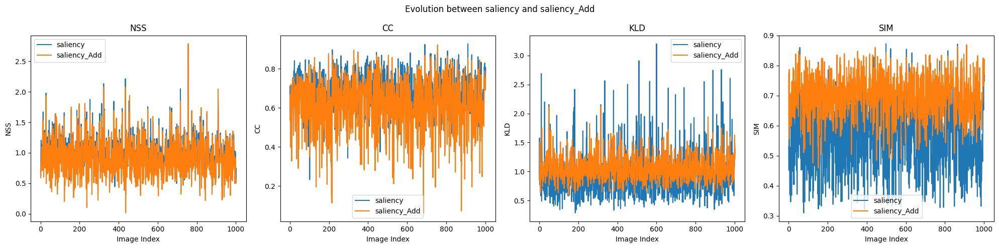

Model :  TranSalNetDense None true o3
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 1.0699792103948058, Median saliency msrt: 1.0119, Variance saliency msrt: 0.16029100958278503
Mean saliency_Add msrt: 1.1331849575212427, Median saliency_Add msrt: 1.0759, Variance saliency_Add msrt: 0.18494408465628245
Mean saliency msrb: 0.8874674162918544, Median saliency msrb: 0.8624, Variance saliency msrb: 0.5349418667044183
Mean saliency_Add msrb: 0.8991547226386812, Median saliency_Add msrb: 0.8667, Variance saliency_Add msrb: 0.5986104017980368


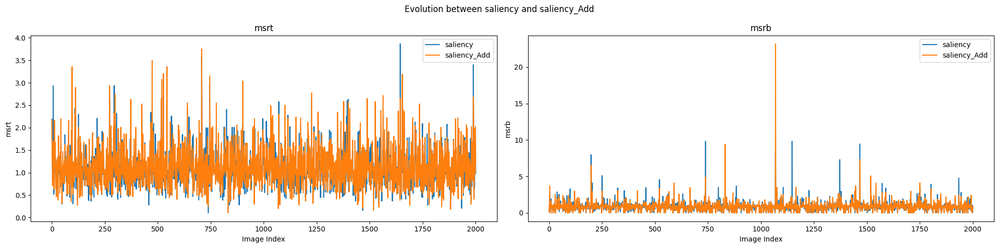

Model :  TranSalNetDense None true p3_sizes
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.7013241666666664, Median saliency msrt: 0.7373, Variance saliency msrt: 0.05625154459454365
Mean saliency_Add msrt: 0.8485352380952398, Median saliency_Add msrt: 0.8571, Variance saliency_Add msrt: 0.11378655904399099
Mean saliency msrb: 2.0835717857142892, Median saliency msrb: 1.3403, Variance saliency msrb: 9.61431395985874
Mean saliency_Add msrb: 1.755349285714286, Median saliency_Add msrb: 1.2439, Variance saliency_Add msrb: 3.144341809689963


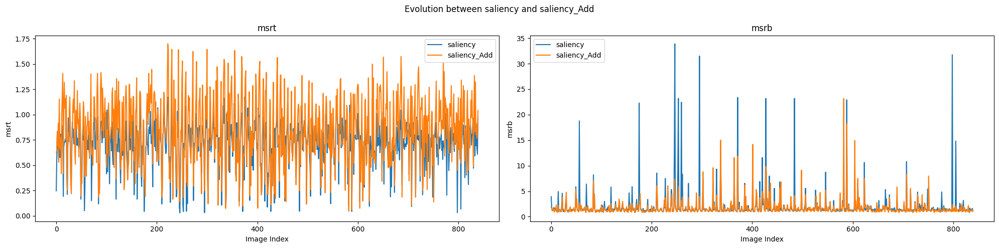

Model :  TranSalNetDense None true p3_colors
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.7982045197740111, Median saliency msrt: 0.7686, Variance saliency msrt: 0.12786140402476945
Mean saliency_Add msrt: 1.180306666666668, Median saliency_Add msrt: 1.1722, Variance saliency_Add msrt: 0.26881536548097906
Mean saliency msrb: 1.7142414689265528, Median saliency msrb: 1.2581, Variance saliency msrb: 2.3778936913537825
Mean saliency_Add msrb: 1.3343041807909597, Median saliency_Add msrb: 1.0424, Variance saliency_Add msrb: 0.7731119881068147


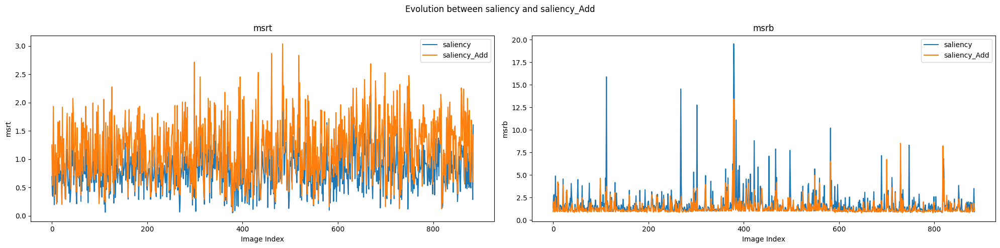

Model :  TranSalNetRes None true p3_orientations
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.529404166666667, Median saliency msrt: 0.5098, Variance saliency msrt: 0.08553503785300928
Mean saliency_Add msrt: 0.6535686342592599, Median saliency_Add msrt: 0.625, Variance saliency_Add msrt: 0.08501387516202367
Mean saliency msrb: 4.351465277777785, Median saliency msrb: 1.9922, Variance saliency msrb: 66.43808521691928
Mean saliency_Add msrb: 1.9759136574074077, Median saliency_Add msrb: 1.6139, Variance saliency_Add msrb: 1.3141266158088438


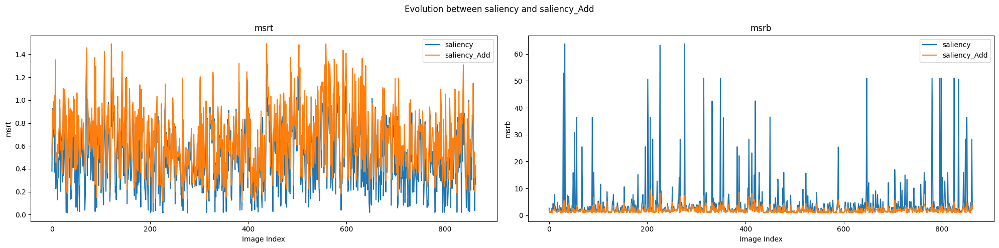

Model :  TranSalNetRes None true mit1003
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['NSS', 'CC', 'KLD', 'SIM']
Mean saliency NSS: 0.978158823016693, Median saliency NSS: 0.9563000202178955, Variance saliency NSS: 0.08193133184575326
Mean saliency_Add NSS: 0.9328682950938331, Median saliency_Add NSS: 0.9222000241279602, Variance saliency_Add NSS: 0.09309443558112415
Mean saliency CC: 0.6560100697906281, Median saliency CC: 0.6673, Variance saliency CC: 0.012687512730104784
Mean saliency_Add CC: 0.6492313060817549, Median saliency_Add CC: 0.6705, Variance saliency_Add CC: 0.018671790286130648
Mean saliency KLD: 0.9347884346959116, Median saliency KLD: 0.8601, Variance saliency KLD: 0.14326204385427968
Mean saliency_Add KLD: 1.1354639082751754, Median saliency_Add KLD: 1.1042, Variance saliency_Add KLD: 0.046819059634575805
Mean saliency SIM: 0.5621035892323031, Median saliency SIM: 0.5684, Variance saliency SIM: 0.0124472656900087

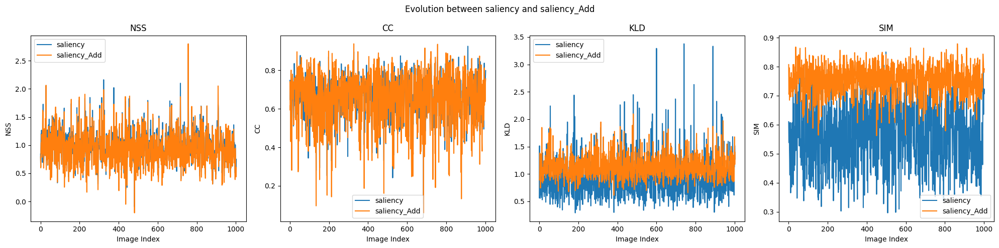

Model :  TranSalNetRes None true o3
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 1.011570064967516, Median saliency msrt: 0.9922, Variance saliency msrt: 0.16299735897895615
Mean saliency_Add msrt: 1.0435595702148954, Median saliency_Add msrt: 1.0119, Variance saliency_Add msrt: 0.1527456086153071
Mean saliency msrb: 0.953439980009994, Median saliency msrb: 0.9059, Variance saliency msrb: 1.6813527869073448
Mean saliency_Add msrb: 0.9342104447776123, Median saliency_Add msrb: 0.9078, Variance saliency_Add msrb: 0.32357962452359085


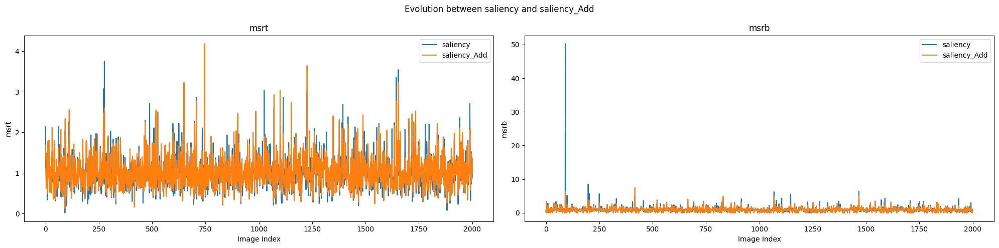

Model :  TranSalNetRes None true p3_sizes
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.517646428571429, Median saliency msrt: 0.4824, Variance saliency msrt: 0.09066227555867346
Mean saliency_Add msrt: 0.6145848809523807, Median saliency_Add msrt: 0.5878, Variance saliency_Add msrt: 0.07279423042617643
Mean saliency msrb: 5.503800952380957, Median saliency msrb: 2.0565, Variance saliency msrb: 268.84818953576126
Mean saliency_Add msrb: 2.111899047619049, Median saliency_Add msrb: 1.7, Variance saliency_Add msrb: 2.253324284713375


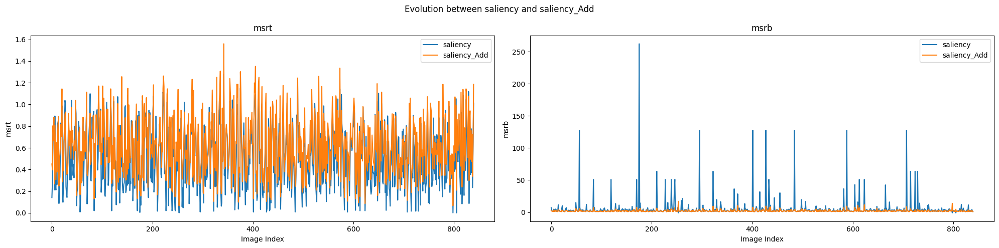

Model :  TranSalNetRes None true p3_colors
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.5844615819209045, Median saliency msrt: 0.5529, Variance saliency msrt: 0.1042163591342206
Mean saliency_Add msrt: 0.7375818079096051, Median saliency_Add msrt: 0.6745, Variance saliency_Add msrt: 0.12440512994023441
Mean saliency msrb: 3.421027683615825, Median saliency msrb: 1.8201, Variance saliency msrb: 48.76839411108672
Mean saliency_Add msrb: 1.7731491525423735, Median saliency_Add msrb: 1.4795, Variance saliency_Add msrb: 1.032255554273293


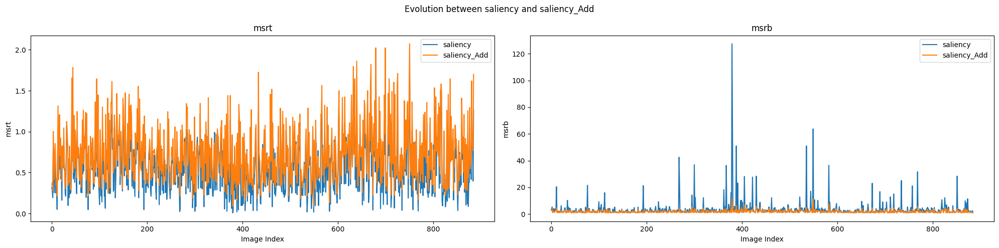

Model :  Unisal 0.5 true p3_orientations
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.13773935185185182, Median saliency msrt: 0.0535, Variance saliency msrt: 0.04648009328939468
Mean saliency_Add msrt: 0.8237160879629618, Median saliency_Add msrt: 0.8196, Variance saliency_Add msrt: 0.04121836454441827
Mean saliency msrb: 48.74740474537037, Median saliency msrb: 9.72, Variance saliency msrb: 21830.17075051872
Mean saliency_Add msrb: 1.3029525462962979, Median saliency_Add msrb: 1.1972, Variance saliency_Add msrb: 0.14331395675277556


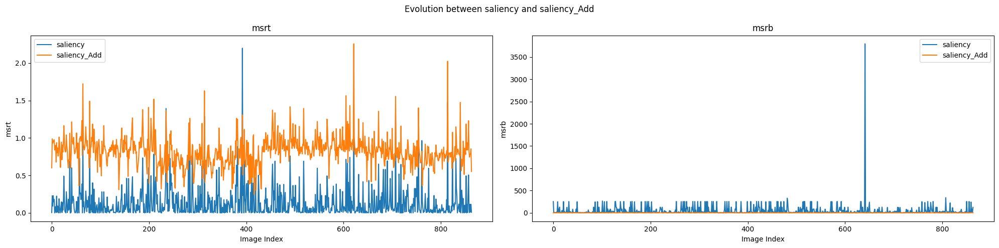

Model :  Unisal 0.5 true mit1003
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['NSS', 'CC', 'KLD', 'SIM']
Mean saliency NSS: 0.7585898305582865, Median saliency NSS: 0.7458000183105469, Variance saliency NSS: 0.08269230436508437
Mean saliency_Add NSS: 0.8071777663729409, Median saliency_Add NSS: 0.7904000282287598, Variance saliency_Add NSS: 0.080034148227394
Mean saliency CC: 0.5513551345962108, Median saliency CC: 0.5618, Variance saliency CC: 0.012246912523486378
Mean saliency_Add CC: 0.642008574277169, Median saliency_Add CC: 0.6535, Variance saliency_Add CC: 0.010300722817807804
Mean saliency KLD: 1.040975174476572, Median saliency KLD: 0.9608, Variance saliency KLD: 0.17922004007162967
Mean saliency_Add KLD: 1.1344378863409774, Median saliency_Add KLD: 1.0978, Variance saliency_Add KLD: 0.06810476295146473
Mean saliency SIM: 0.513638484546361, Median saliency SIM: 0.5156, Variance saliency SIM: 0.0014841284491490605
Mean sali

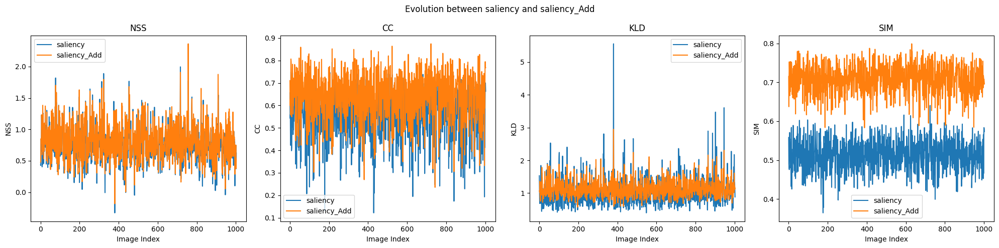

Model :  Unisal 0.5 true o3
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.8071819590204916, Median saliency msrt: 0.6588, Variance saliency msrt: 0.4572798763811691
Mean saliency_Add msrt: 1.0044900049975025, Median saliency_Add msrt: 0.9373, Variance saliency_Add msrt: 0.21051189083463315
Mean saliency msrb: 1.8735679660169926, Median saliency msrb: 1.0159, Variance saliency msrb: 34.904936287734444
Mean saliency_Add msrb: 0.9619125937031479, Median saliency_Add msrb: 0.897, Variance saliency_Add msrb: 0.43032869152555697


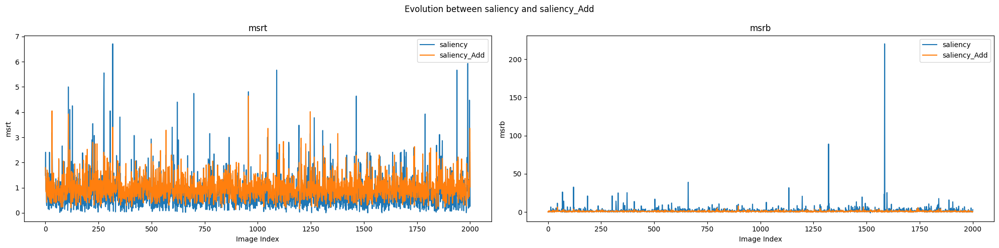

Model :  Unisal 0.5 true p3_sizes
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.13168345238095228, Median saliency msrt: 0.0667, Variance saliency msrt: 0.031303502452366815
Mean saliency_Add msrt: 0.7215957142857143, Median saliency_Add msrt: 0.7402, Variance saliency_Add msrt: 0.04194375557687074
Mean saliency msrb: 40.24386261904763, Median saliency msrb: 7.9615, Variance saliency msrb: 5002.011091857052
Mean saliency_Add msrb: 1.4678396428571432, Median saliency_Add msrb: 1.2974, Variance saliency_Add msrb: 0.35104635074987267


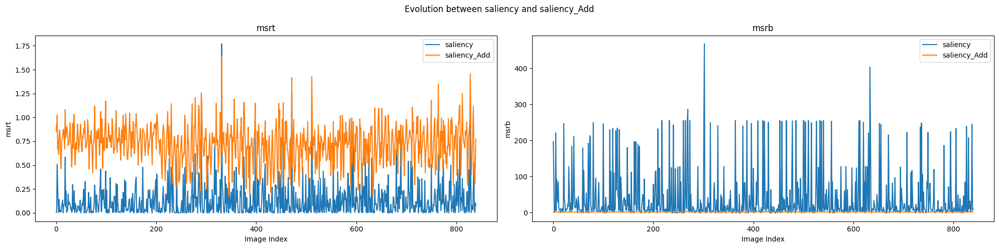

Model :  Unisal 0.5 true p3_colors
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.30275514124293784, Median saliency msrt: 0.1647, Variance saliency msrt: 0.1393925829029462
Mean saliency_Add msrt: 1.0993355932203397, Median saliency_Add msrt: 0.9882, Variance saliency_Add msrt: 0.1886383295240829
Mean saliency msrb: 20.983138757062175, Median saliency msrb: 4.9, Variance saliency msrb: 2055.2127297257175
Mean saliency_Add msrb: 1.046425423728814, Median saliency_Add msrb: 0.9881, Variance saliency_Add msrb: 0.12007124121804064


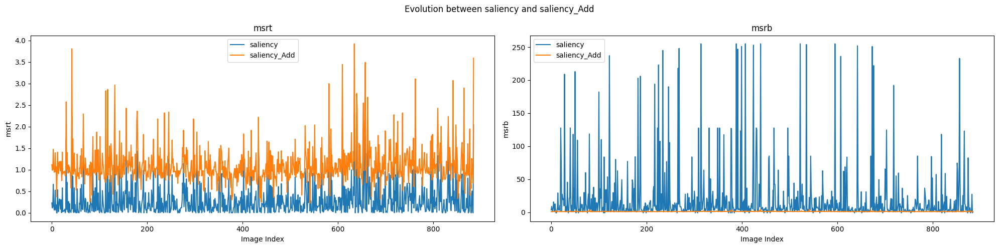

Model :  TranSalNetRes 0.5 true p3_orientations
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.529404166666667, Median saliency msrt: 0.5098, Variance saliency msrt: 0.08553503785300928
Mean saliency_Add msrt: 0.6549085648148153, Median saliency_Add msrt: 0.625, Variance saliency_Add msrt: 0.08791792916275509
Mean saliency msrb: 4.351465277777785, Median saliency msrb: 1.9922, Variance saliency msrb: 66.43808521691928
Mean saliency_Add msrb: 1.9931478009259267, Median saliency_Add msrb: 1.6139, Variance saliency_Add msrb: 1.427768658675721


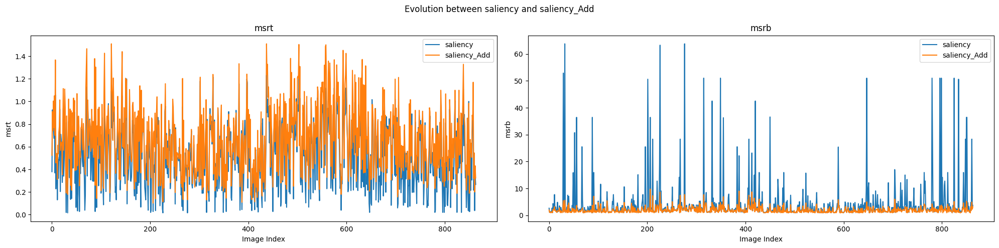

Model :  TranSalNetRes 0.5 true mit1003
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['NSS', 'CC', 'KLD', 'SIM']
Mean saliency NSS: 0.978158823016693, Median saliency NSS: 0.9563000202178955, Variance saliency NSS: 0.08193133184575326
Mean saliency_Add NSS: 0.9323148559723217, Median saliency_Add NSS: 0.9221000075340271, Variance saliency_Add NSS: 0.09356525712257277
Mean saliency CC: 0.6560100697906281, Median saliency CC: 0.6673, Variance saliency CC: 0.012687512730104784
Mean saliency_Add CC: 0.6468186440677969, Median saliency_Add CC: 0.667, Variance saliency_Add CC: 0.018935650569646984
Mean saliency KLD: 0.9347884346959116, Median saliency KLD: 0.8601, Variance saliency KLD: 0.14326204385427968
Mean saliency_Add KLD: 1.116398005982053, Median saliency_Add KLD: 1.0869, Variance saliency_Add KLD: 0.04769255345564506
Mean saliency SIM: 0.5621035892323031, Median saliency SIM: 0.5684, Variance saliency SIM: 0.012447265690008737
M

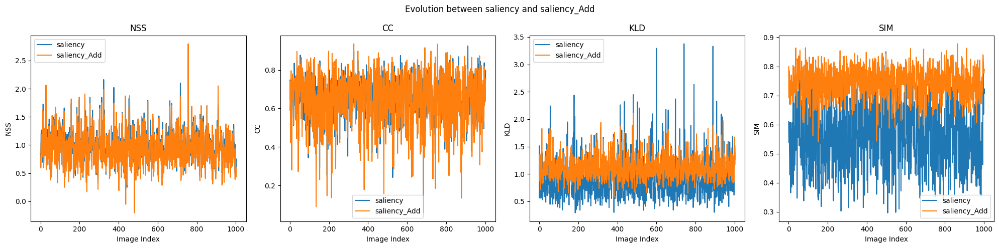

Model :  TranSalNetRes 0.5 true o3
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 1.011570064967516, Median saliency msrt: 0.9922, Variance saliency msrt: 0.16299735897895615
Mean saliency_Add msrt: 1.04638375812094, Median saliency_Add msrt: 1.0159, Variance saliency_Add msrt: 0.15908499296458717
Mean saliency msrb: 0.953439980009994, Median saliency msrb: 0.9059, Variance saliency msrb: 1.6813527869073448
Mean saliency_Add msrb: 0.9373176911544214, Median saliency_Add msrb: 0.9059, Variance saliency_Add msrb: 0.3405073943496918


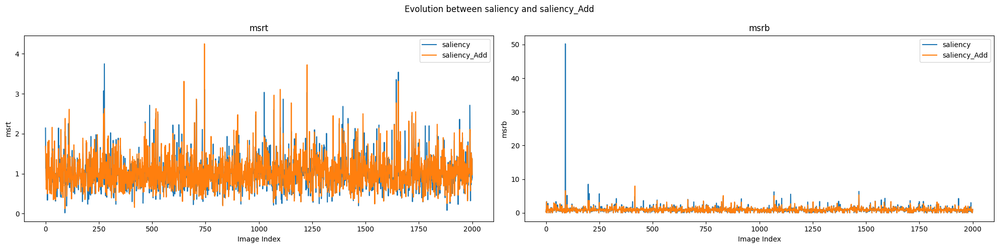

Model :  TranSalNetRes 0.5 true p3_sizes
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.517646428571429, Median saliency msrt: 0.4824, Variance saliency msrt: 0.09066227555867346
Mean saliency_Add msrt: 0.6147110714285712, Median saliency_Add msrt: 0.5846, Variance saliency_Add msrt: 0.07527319972266165
Mean saliency msrb: 5.503800952380957, Median saliency msrb: 2.0565, Variance saliency msrb: 268.84818953576126
Mean saliency_Add msrb: 2.141350952380951, Median saliency_Add msrb: 1.6944, Variance saliency_Add msrb: 2.5586057937609983


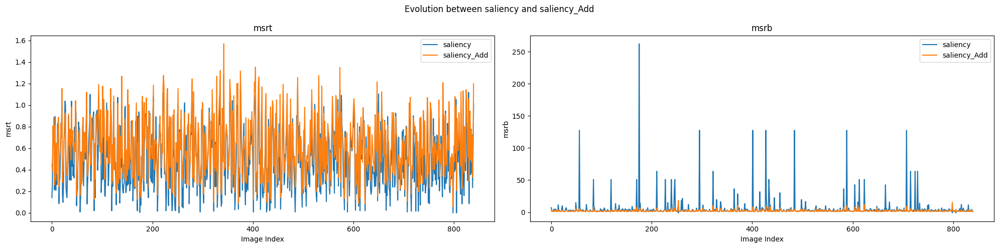

Model :  TranSalNetRes 0.5 true p3_colors
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.5844615819209045, Median saliency msrt: 0.5529, Variance saliency msrt: 0.1042163591342206
Mean saliency_Add msrt: 0.7412094915254238, Median saliency_Add msrt: 0.6773, Variance saliency_Add msrt: 0.12915258131104104
Mean saliency msrb: 3.421027683615825, Median saliency msrb: 1.8201, Variance saliency msrb: 48.76839411108672
Mean saliency_Add msrb: 1.783416836158194, Median saliency_Add msrb: 1.4771, Variance saliency_Add msrb: 1.1115558335357523


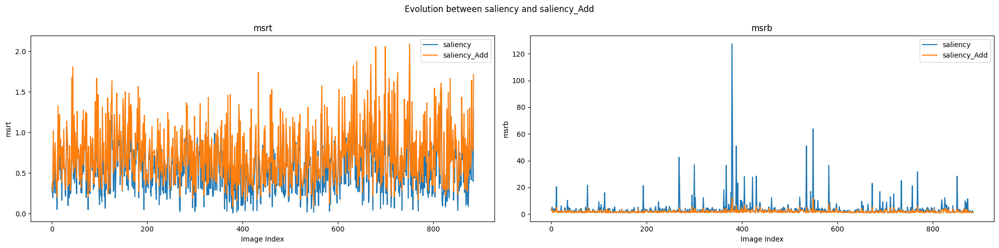

Model :  TempSal 0.9 true p3_orientations
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.4441369212962961, Median saliency msrt: 0.2451, Variance saliency msrt: 0.2796979407780211
Mean saliency_Add msrt: 0.8480451388888881, Median saliency_Add msrt: 0.7333, Variance saliency_Add msrt: 0.22180681613377692
Mean saliency msrb: 131.77414143518516, Median saliency msrb: 3.0488, Variance saliency msrb: 5425843.796492775
Mean saliency_Add msrb: 1.5396736111111113, Median saliency_Add msrb: 1.3152, Variance saliency_Add msrb: 0.4042265733314043


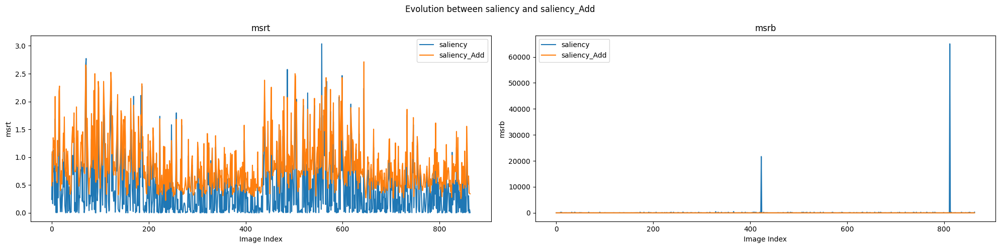

Model :  TempSal 0.9 true mit1003
Metrics :  ['GT', 'saliency', 'rarity', 'saliency_Add', 'saliency_Prod', 'saliency_Itti']
['NSS', 'CC', 'KLD', 'SIM']
Mean saliency NSS: 0.9393891316586929, Median saliency NSS: 0.9200999736785889, Variance saliency NSS: 0.08700733476892165
Mean saliency_Add NSS: 0.8452332004355053, Median saliency_Add NSS: 0.8208000063896179, Variance saliency_Add NSS: 0.08523780813669735
Mean saliency CC: 0.6416356929212369, Median saliency CC: 0.6537, Variance saliency CC: 0.00810402012182793
Mean saliency_Add CC: 0.5780419740777676, Median saliency_Add CC: 0.5903, Variance saliency_Add CC: 0.01169018712152677
Mean saliency KLD: 0.8860582253240276, Median saliency KLD: 0.8239, Variance saliency KLD: 0.11005440107641186
Mean saliency_Add KLD: 1.0561317048853445, Median saliency_Add KLD: 1.0225, Variance saliency_Add KLD: 0.06150292232481015
Mean saliency SIM: 0.5356086739780663, Median saliency SIM: 0.5358, Variance saliency SIM: 0.0019761650394181387
Mean saliency_A

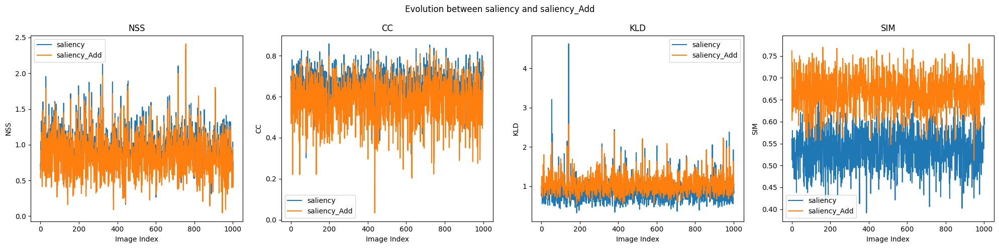

Model :  TempSal 0.9 true o3
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 1.0783902048975527, Median saliency msrt: 1.0126, Variance saliency msrt: 0.23818543664568517
Mean saliency_Add msrt: 1.1740933533233386, Median saliency_Add msrt: 1.1233, Variance saliency_Add msrt: 0.25657137223468246
Mean saliency msrb: 1.163637381309347, Median saliency msrb: 0.8419, Variance saliency msrb: 56.42605133769292
Mean saliency_Add msrb: 0.8985051474262878, Median saliency_Add msrb: 0.8353, Variance saliency_Add msrb: 0.3427866010479659


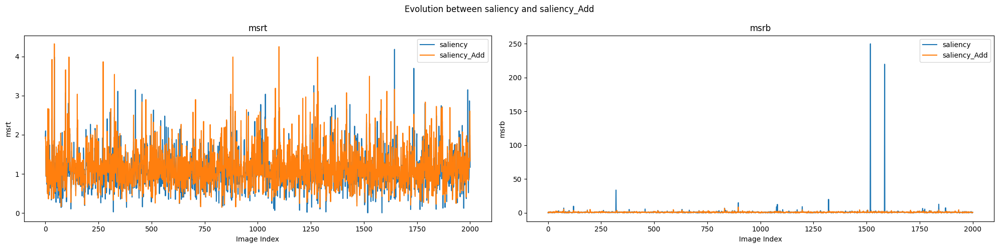

Model :  TempSal 0.9 true p3_sizes
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.5227486904761897, Median saliency msrt: 0.3255, Variance saliency msrt: 0.32487979504590364
Mean saliency_Add msrt: 0.7366645238095251, Median saliency_Add msrt: 0.6339, Variance saliency_Add msrt: 0.17680018214620194
Mean saliency msrb: 44.270778333333304, Median saliency msrb: 1.8613, Variance saliency msrb: 205439.68031637144
Mean saliency_Add msrb: 1.8229735714285704, Median saliency_Add msrb: 1.519, Variance saliency_Add msrb: 0.8300363387539109


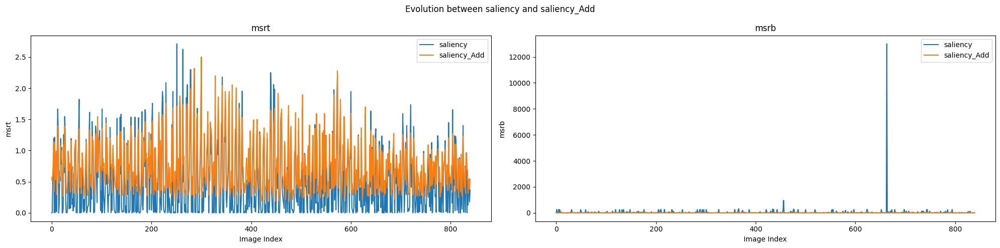

Model :  TempSal 0.9 true p3_colors
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 1.6989618079096032, Median saliency msrt: 1.5592, Variance saliency msrt: 1.3130469538859941
Mean saliency_Add msrt: 2.0982448587570617, Median saliency_Add msrt: 1.9922, Variance saliency_Add msrt: 0.915019522835147
Mean saliency msrb: 4.087257175141251, Median saliency msrb: 1.0494, Variance saliency msrb: 530.4984465020418
Mean saliency_Add msrb: 0.9658719774011307, Median saliency_Add msrb: 0.9255, Variance saliency_Add msrb: 0.05069628746332142


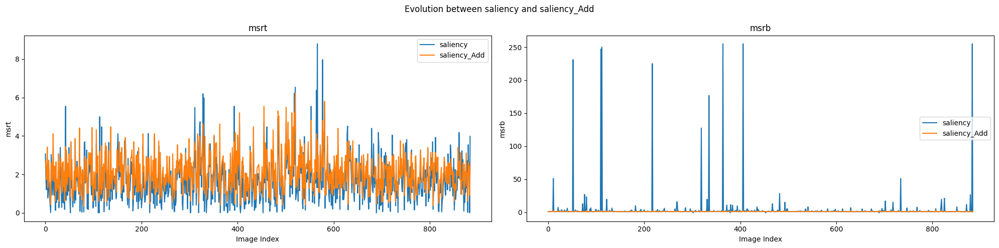

Model :  TranSalNetDense 0.9 true p3_orientations
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.7296776620370378, Median saliency msrt: 0.7647, Variance saliency msrt: 0.0534610293737006
Mean saliency_Add msrt: 0.903676504629629, Median saliency_Add msrt: 0.8775, Variance saliency_Add msrt: 0.1647597407558378
Mean saliency msrb: 1.6576196759259272, Median saliency msrb: 1.3077, Variance saliency msrb: 1.4551561883860042
Mean saliency_Add msrb: 1.6669260416666651, Median saliency_Add msrb: 1.25, Variance saliency_Add msrb: 1.3548033469954446


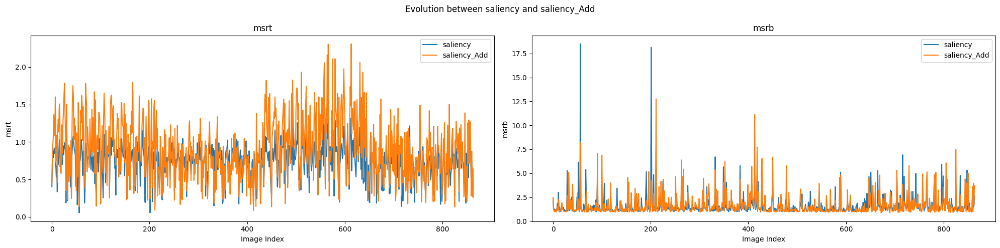

Model :  TranSalNetDense 0.9 true mit1003
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['NSS', 'CC', 'KLD', 'SIM']
Mean saliency NSS: 0.990077269487343, Median saliency NSS: 0.9605000019073486, Variance saliency NSS: 0.07963707313250618
Mean saliency_Add NSS: 0.9110543363405427, Median saliency_Add NSS: 0.8858000040054321, Variance saliency_Add NSS: 0.08867724226662604
Mean saliency CC: 0.6588360917248259, Median saliency CC: 0.6707, Variance saliency CC: 0.014206570821016512
Mean saliency_Add CC: 0.6059282153539394, Median saliency_Add CC: 0.6267, Variance saliency_Add CC: 0.01815490086889881
Mean saliency KLD: 0.9377387836490524, Median saliency KLD: 0.8665, Variance saliency KLD: 0.15440264026053438
Mean saliency_Add KLD: 1.0157142572283149, Median saliency_Add KLD: 0.9835, Variance saliency_Add KLD: 0.04945906756343141
Mean saliency SIM: 0.5619850448654031, Median saliency SIM: 0.5587, Variance saliency SIM: 0.01377764960685242

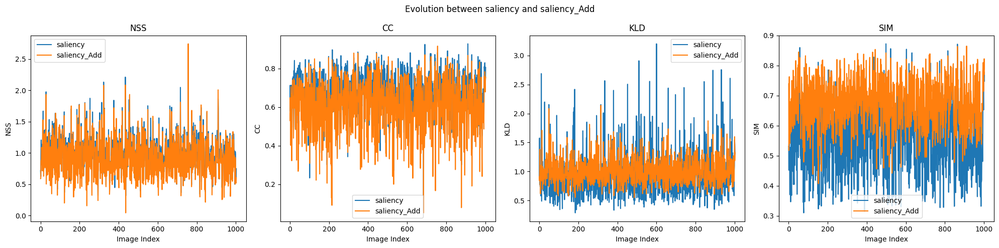

Model :  TranSalNetDense 0.9 true o3
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 1.0699792103948058, Median saliency msrt: 1.0119, Variance saliency msrt: 0.16029100958278503
Mean saliency_Add msrt: 1.1596235882058996, Median saliency_Add msrt: 1.0944, Variance saliency_Add msrt: 0.22497576114274592
Mean saliency msrb: 0.8874674162918544, Median saliency msrb: 0.8624, Variance saliency msrb: 0.5349418667044183
Mean saliency_Add msrb: 0.8975046976511751, Median saliency_Add msrb: 0.8549, Variance saliency_Add msrb: 0.5780556102627896


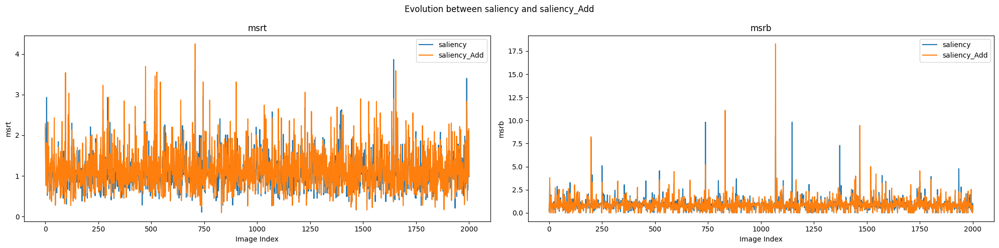

Model :  TranSalNetDense 0.9 true p3_sizes
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.7013241666666664, Median saliency msrt: 0.7373, Variance saliency msrt: 0.05625154459454365
Mean saliency_Add msrt: 0.8793903571428591, Median saliency_Add msrt: 0.8819, Variance saliency_Add msrt: 0.1381727353474914
Mean saliency msrb: 2.0835717857142892, Median saliency msrb: 1.3403, Variance saliency msrb: 9.61431395985874
Mean saliency_Add msrb: 1.8113244047619046, Median saliency_Add msrb: 1.2379, Variance saliency_Add msrb: 4.245958189297268


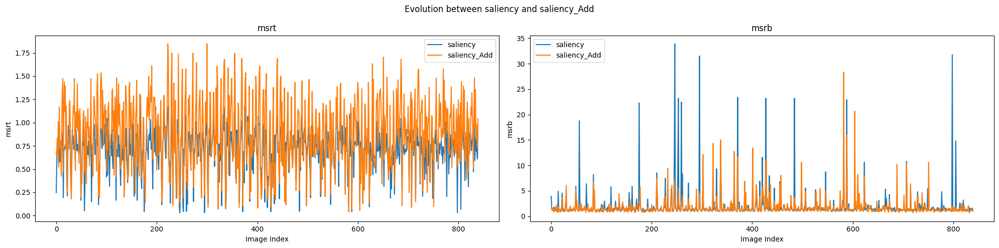

Model :  TranSalNetDense 0.9 true p3_colors
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.7982045197740111, Median saliency msrt: 0.7686, Variance saliency msrt: 0.12786140402476945
Mean saliency_Add msrt: 1.2446882485875717, Median saliency_Add msrt: 1.2475, Variance saliency_Add msrt: 0.29901533310484213
Mean saliency msrb: 1.7142414689265528, Median saliency msrb: 1.2581, Variance saliency msrb: 2.3778936913537825
Mean saliency_Add msrb: 1.2903666666666682, Median saliency_Add msrb: 1.0324, Variance saliency_Add msrb: 0.6486870789453866


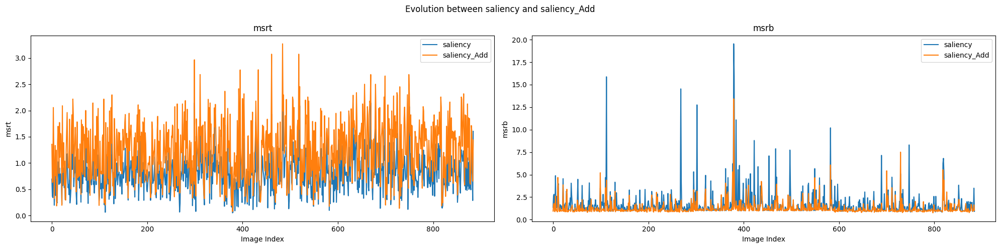

Model :  Unisal 0.9 true p3_orientations
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.137803125, Median saliency msrt: 0.0549, Variance saliency msrt: 0.04622517511754906
Mean saliency_Add msrt: 0.9002721064814821, Median saliency_Add msrt: 0.8941, Variance saliency_Add msrt: 0.05064310573815534
Mean saliency msrb: 61.522992708333355, Median saliency msrb: 9.72, Variance saliency msrb: 201736.47700900515
Mean saliency_Add msrb: 1.218466087962964, Median saliency_Add msrb: 1.0991, Variance saliency_Add msrb: 0.17812145608376959


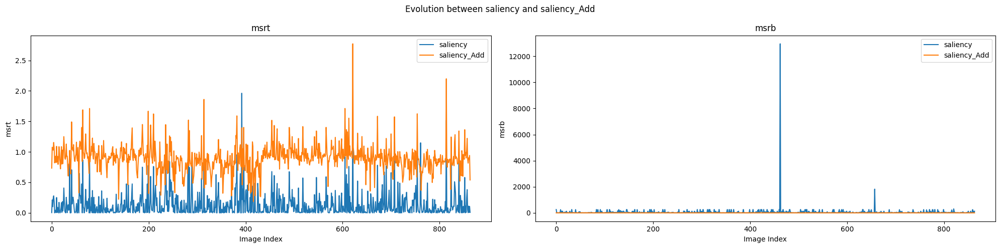

Model :  Unisal 0.9 true mit1003
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['NSS', 'CC', 'KLD', 'SIM']
Mean saliency NSS: 0.7579050845824505, Median saliency NSS: 0.7422999739646912, Variance saliency NSS: 0.08213229360572483
Mean saliency_Add NSS: 0.7811816552076358, Median saliency_Add NSS: 0.7642999887466431, Variance saliency_Add NSS: 0.0800254292061392
Mean saliency CC: 0.5513304087736787, Median saliency CC: 0.5627, Variance saliency CC: 0.012170159882883749
Mean saliency_Add CC: 0.6001525423728815, Median saliency_Add CC: 0.6094, Variance saliency_Add CC: 0.011088807558341912
Mean saliency KLD: 1.0405307078763715, Median saliency KLD: 0.9581, Variance saliency KLD: 0.17256872753160227
Mean saliency_Add KLD: 1.0898957128614157, Median saliency_Add KLD: 1.0436, Variance saliency_Add KLD: 0.08018815048012504
Mean saliency SIM: 0.5138366899302093, Median saliency SIM: 0.516, Variance saliency SIM: 0.0014547670486645713
Mean s

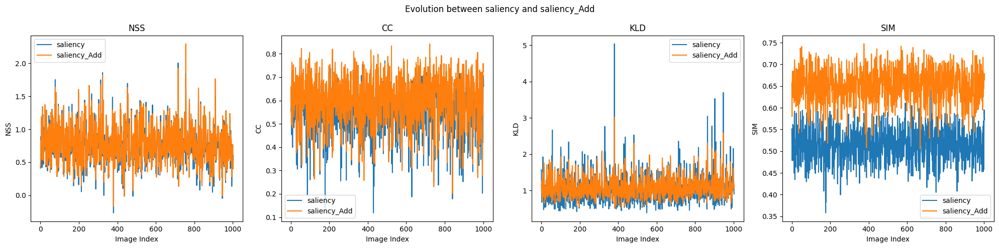

Model :  Unisal 0.9 true o3
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.8074267366316846, Median saliency msrt: 0.6574, Variance saliency msrt: 0.4525450746124871
Mean saliency_Add msrt: 1.0221612193903065, Median saliency_Add msrt: 0.9529, Variance saliency_Add msrt: 0.2582174712596816
Mean saliency msrb: 1.825302348825589, Median saliency msrb: 1.012, Variance saliency msrb: 17.245767440159398
Mean saliency_Add msrb: 0.975887706146927, Median saliency_Add msrb: 0.8784, Variance saliency_Add msrb: 0.5427323405585047


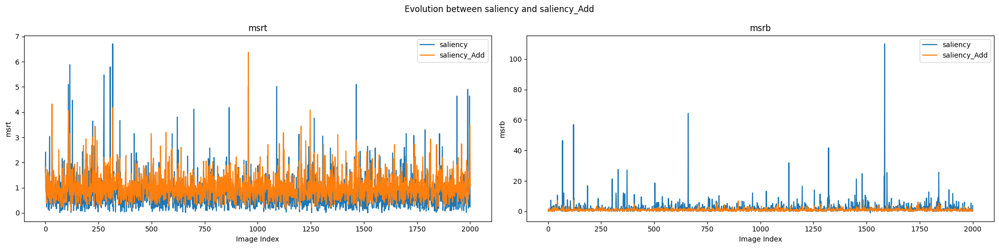

Model :  Unisal 0.9 true p3_sizes
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.12897095238095252, Median saliency msrt: 0.0692, Variance saliency msrt: 0.02900020258480726
Mean saliency_Add msrt: 0.7721979761904757, Median saliency_Add msrt: 0.8157, Variance saliency_Add msrt: 0.05998626693638026
Mean saliency msrb: 50.44943761904759, Median saliency msrb: 8.4444, Variance saliency msrb: 60397.64122457673
Mean saliency_Add msrb: 1.464162261904763, Median saliency_Add msrb: 1.1697, Variance saliency_Add msrb: 0.788091141611551


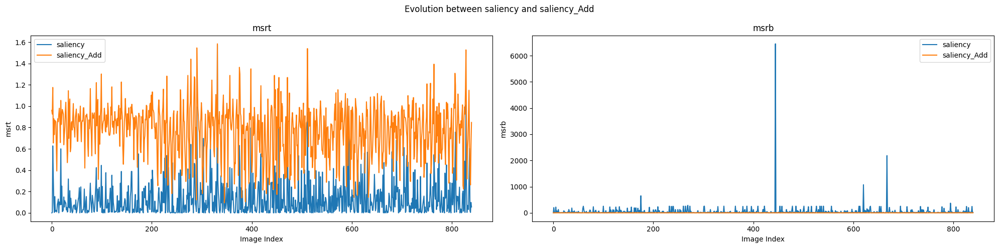

Model :  Unisal 0.9 true p3_colors
Metrics :  ['saliency', 'rarity', 'saliency_Add', 'saliency_Sub', 'saliency_Prod', 'saliency_Itti']
['msrt', 'msrb']
Mean saliency msrt: 0.3029410169491526, Median saliency msrt: 0.1686, Variance saliency msrt: 0.13611385023851374
Mean saliency_Add msrt: 1.1577414689265553, Median saliency_Add msrt: 1.0451, Variance saliency_Add msrt: 0.19903892335377454
Mean saliency msrb: 19.723810847457628, Median saliency msrb: 5.0, Variance saliency msrb: 1878.1310952071592
Mean saliency_Add msrb: 1.0053867796610179, Median saliency_Add msrb: 0.9529, Variance saliency_Add msrb: 0.1592171558591209


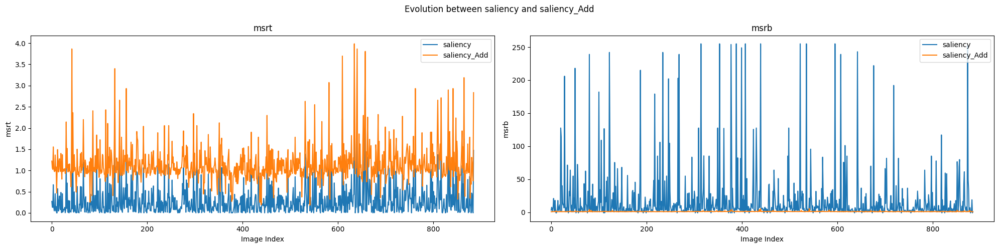

In [78]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def get_best_and_worst_results(results , key,metric):

    list_results = []

    for d in results:
        list_results.append({
            'filename' : d['filename'],
            'path' : d['path'],
            'value' : d['metrics'][key][metric]
        })

    best_results = sorted(list_results, key=lambda x: x['value'], reverse=True)
    worst_results = sorted(list_results, key=lambda x: x['value'], reverse=False)

    return best_results[0:5], worst_results[0:5]

def show_list_results(results,title):

    fig, axes = plt.subplots(1, 5, figsize=(20, 5))
    fig.suptitle(title)
    for ax, img_info in zip(axes, results):
        print(img_info)
        img = mpimg.imread(os.path.join(img_info['path'].replace('images/images', 'images/'), img_info['filename']))

        cv2.imread("./images/" + img_info['filename'])
        ax.imshow(img)
        ax.set_title(f"Value: {img_info['value']:.4f}")
        ax.axis('off')
    plt.show()


def evolution_metrics_btw_maps(results,key1,key2):

    metrics = list(results[0]['metrics'][key1].keys())
    if "statistics" in metrics:
        metrics.pop(metrics.index("statistics"))

    print(metrics)

    fig, axes = plt.subplots(1, len(metrics), figsize=(20, 5))
    fig.suptitle(f'Evolution between {key1} and {key2}')

    for ax, metric in zip(axes, metrics):
        key1_values = []
        key2_values = []

        for d in results:
            key1_values.append(d['metrics'][key1][metric])
            key2_values.append(d['metrics'][key2][metric])

        mean_key1 = sum(key1_values) / len(key1_values)
        mean_key2 = sum(key2_values) / len(key2_values)

        median_key1 = sorted(key1_values)[len(key1_values) // 2]
        median_key2 = sorted(key2_values)[len(key2_values) // 2]

        variance_key1 = sum((x - mean_key1) ** 2 for x in key1_values) / len(key1_values)
        variance_key2 = sum((x - mean_key2) ** 2 for x in key2_values) / len(key2_values)

        print(f"Mean {key1} {metric}: {mean_key1}, Median {key1} {metric}: {median_key1}, Variance {key1} {metric}: {variance_key1}")
        print(f"Mean {key2} {metric}: {mean_key2}, Median {key2} {metric}: {median_key2}, Variance {key2} {metric}: {variance_key2}")

        ax.plot(key1_values, label=key1)
        ax.plot(key2_values, label=key2)
        ax.set_xlabel('Image Index')
        ax.set_ylabel(metric)
        ax.set_title(metric)
        ax.legend()

    plt.tight_layout()
    plt.show()

    return None


#  Metrics = NSS CC SIM KLD AUC

# Analyse statistics of the data
for d in data:
    print("Model : " , d['model'], d['threshold'] , d['finetune'] ,d['dataset'])

    #  get list of metrics in results
    metrics = list(d['results'][0]['metrics'].keys())
    print("Metrics : ", metrics)

    # bests_saliency, worsts_saliency = get_best_and_worst_results(d['results'], key= 'saliency', metric='SIM')
    # show_list_results(bests_saliency, "Best Saliency SIM")
    # show_list_results(worsts_saliency, "Worst Saliency SIM")

    # bests_add_saliency, worsts_add_saliency = get_best_and_worst_results(d['results'], key= 'saliency_Add', metric='SIM')
    # show_list_results(bests_add_saliency, "Best Saliency ADD SIM")
    # show_list_results(worsts_add_saliency, "Worst Saliency ADD SIM")

    evolution_metrics_btw_maps(d['results'], key1='saliency', key2='saliency_Add')

    # evolution_metrics_btw_maps(d['results'], key1='saliency', key2='saliency_Add', metric='CC')

    # evolution_metrics_btw_maps(d['results'], key1='saliency', key2='saliency_Add', metric='NSS')

    # evolution_metrics_btw_maps(d['results'], key1='saliency', key2='saliency_Add', metric='KLD')












